[![Google Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/idealo/image-super-resolution/blob/master/notebooks/ISR_Training_Tutorial.ipynb)

# Install ISR

In [1]:
!pip install ISR

     |████████████████████████████████| 86.3MB 64kB/s 
     |████████████████████████████████| 3.8MB 28.7MB/s 
     |████████████████████████████████| 450kB 39.7MB/s 
  Created wheel for gast: filename=gast-0.2.2-cp36-none-any.whl size=7540 sha256=44fba304cb63dd4b35636f39f7959b742c41dd97336459c882205c949fea8c49
  Stored in directory: /root/.cache/pip/wheels/5c/2e/7e/a1d4d4fcebe6c381f378ce7743a3ced3699feb89bcfbdadadd
Successfully built gast
ERROR: tensorflow-probability 0.10.0 has requirement gast>=0.3.2, but you'll have gast 0.2.2 which is incompatible.
  Found existing installation: tensorboard 2.2.2
    Uninstalling tensorboard-2.2.2:
      Successfully uninstalled tensorboard-2.2.2
  Found existing installation: tensorflow-estimator 2.2.0
    Uninstalling tensorflow-estimator-2.2.0:
      Successfully uninstalled tensorflow-estimator-2.2.0
  Found existing installation: gast 0.3.3
    Uninstalling gast-0.3.3:
      Successfully uninstalled gast-0.3.3
  Found existing installation: t

# Train


## Get the training data
Get your data to train the model. The div2k dataset linked here is for a scaling factor of 2. Beware of this later when training the model.

(for more options on how to get you data on Colab notebooks visit https://colab.research.google.com/notebooks/io.ipynb)

In [2]:
!wget http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_LR_bicubic_X2.zip
!wget http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_valid_LR_bicubic_X2.zip
!wget http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_HR.zip
!wget http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_valid_HR.zip

--2020-07-30 12:14:29--  http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_LR_bicubic_X2.zip
Resolving data.vision.ee.ethz.ch (data.vision.ee.ethz.ch)... 129.132.52.162
Connecting to data.vision.ee.ethz.ch (data.vision.ee.ethz.ch)|129.132.52.162|:80... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_LR_bicubic_X2.zip [following]
--2020-07-30 12:14:30--  https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_LR_bicubic_X2.zip
Connecting to data.vision.ee.ethz.ch (data.vision.ee.ethz.ch)|129.132.52.162|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 925390592 (883M) [application/zip]
Saving to: ‘DIV2K_train_LR_bicubic_X2.zip’

DIV2K_train_LR_bicu 100%[===================>] 882.52M  12.4MB/s    in 71s     

2020-07-30 12:15:41 (12.4 MB/s) - ‘DIV2K_train_LR_bicubic_X2.zip’ saved [925390592/925390592]

--2020-07-30 12:15:42--  http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_valid_LR_bicubic_X

In [3]:
!mkdir div2k
!unzip -q DIV2K_valid_LR_bicubic_X2.zip -d div2k
!unzip -q DIV2K_train_LR_bicubic_X2.zip -d div2k
!unzip -q DIV2K_train_HR.zip -d div2k
!unzip -q DIV2K_valid_HR.zip -d div2k

## Create the models
Import the models from the ISR package and create

- a RRDN super scaling network
- a discriminator network for GANs training
- a VGG19 feature extractor to train with a perceptual loss function

Carefully select
- 'x': this is the upscaling factor (2 by default)
- 'layers_to_extract': these are the layers from the VGG19 that will be used in the perceptual loss (leave the default if you're not familiar with it)
- 'lr_patch_size': this is the size of the patches that will be extracted from the LR images and fed to the ISR network during training time

Play around with the other architecture parameters

In [4]:
from ISR.models import RRDN
from ISR.models import Discriminator
from ISR.models import Cut_VGG19

In [5]:
lr_train_patch_size = 40
layers_to_extract = [5, 9]
scale = 2
hr_train_patch_size = lr_train_patch_size * scale

rrdn  = RRDN(arch_params={'C':4, 'D':3, 'G':64, 'G0':64, 'T':10, 'x':scale}, patch_size=lr_train_patch_size)
f_ext = Cut_VGG19(patch_size=hr_train_patch_size, layers_to_extract=layers_to_extract)
discr = Discriminator(patch_size=hr_train_patch_size, kernel_size=3)

80142336/80134624 [==============================] - 1s 0us/step


## Give the models to the Trainer
The Trainer object will combine the networks, manage your training data and keep you up-to-date with the training progress through Tensorboard and the command line.

Here we do not use  the pixel-wise MSE but only the perceptual loss by specifying the respective weights in `loss_weights`

In [6]:
from ISR.train import Trainer
loss_weights = {
  'generator': 0.0,
  'feature_extractor': 0.0833,
  'discriminator': 0.01
}
losses = {
  'generator': 'mae',
  'feature_extractor': 'mse',
  'discriminator': 'binary_crossentropy'
} 

log_dirs = {'logs': './logs', 'weights': './weights'}

learning_rate = {'initial_value': 0.0004, 'decay_factor': 0.5, 'decay_frequency': 30}

flatness = {'min': 0.0, 'max': 0.15, 'increase': 0.01, 'increase_frequency': 5}

trainer = Trainer(
    generator=rrdn,
    discriminator=discr,
    feature_extractor=f_ext,
    lr_train_dir='div2k/DIV2K_train_LR_bicubic/X2/',
    hr_train_dir='div2k/DIV2K_train_HR/',
    lr_valid_dir='div2k/DIV2K_train_LR_bicubic/X2/',
    hr_valid_dir='div2k/DIV2K_train_HR/',
    loss_weights=loss_weights,
    learning_rate=learning_rate,
    flatness=flatness,
    dataname='div2k',
    log_dirs=log_dirs,
    weights_generator=None,
    weights_discriminator=None,
    n_validation=40,
)


Choose epoch number, steps and batch size and start training

In [7]:
trainer.train(
    epochs=10,
    steps_per_epoch=20,
    batch_size=4,
    monitored_metrics={'val_generator_PSNR_Y': 'max'}
)


Training details:
  training_parameters: 
    metrics: {'generator': <function PSNR_Y at 0x7f92acada8c8>}
    losses: {'generator': 'mae', 'discriminator': 'binary_crossentropy', 'feature_extractor': 'mse'}
    adam_optimizer: {'beta1': 0.9, 'beta2': 0.999, 'epsilon': None}
    learning_rate: {'initial_value': 0.0004, 'decay_factor': 0.5, 'decay_frequency': 30}
    flatness: {'min': 0.0, 'max': 0.15, 'increase': 0.01, 'increase_frequency': 5}
    n_validation: 40
    dataname: div2k
    fallback_save_every_n_epochs: 2
    log_dirs: {'logs': './logs', 'weights': './weights'}
    loss_weights: {'generator': 0.0, 'feature_extractor': 0.0833, 'discriminator': 0.01}
    hr_valid_dir: div2k/DIV2K_train_HR/
    lr_valid_dir: div2k/DIV2K_train_LR_bicubic/X2/
    hr_train_dir: div2k/DIV2K_train_HR/
    lr_train_dir: div2k/DIV2K_train_LR_bicubic/X2/
    lr_patch_size: 40
    steps_per_epoch: 20
    batch_size: 4
    starting_epoch: 0
  generator: 
    name: rrdn
    parameters: {'C': 4, 'D': 3,

Epoch 0/10
Current learning rate: 0.00039999998989515007
100%|██████████| 20/20 [10:36<00:00, 31.81s/it]
Epoch 0 took      636.1s


160/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

{'val_loss': 0.935651283711195, 'val_generator_loss': 0.43419456, 'val_discriminator_loss': 0.061764956, 'val_feature_extractor_loss': 3.6245842, 'val_feature_extractor_1_loss': 18.825203, 'val_generator_PSNR_Y': 7.5375032, 'train_d_real_loss': 0.026163902, 'train_d_real_accuracy': 1.0, 'train_d_fake_loss': 0.06104249, 'train_d_fake_accuracy': 1.0, 'train_loss': 1.4374113, 'train_generator_loss': 0.36056182, 'train_discriminator_loss': 0.0067702895, 'train_feature_extractor_loss': 6.5989113, 'train_feature_extractor_1_loss': 27.911139, 'train_generator_PSNR_Y': 7.8345485}
val_generator_PSNR_Y improved from       -inf to    7.53750
Saving weights
Epoch 1/10
Current learning rate: 0.00039999998989515007
100%|██████████| 20/20 [10:18<00:00, 30.94s/it]
Epoch 1 took      618.8s


160/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

{'val_loss': 0.5838029585778713, 'val_generator_loss': 0.43697175, 'val_discriminator_loss': 0.0020503416, 'val_feature_extractor_loss': 2.7507353, 'val_feature_extractor_1_loss': 11.26565, 'val_generator_PSNR_Y': 7.6937284, 'train_d_real_loss': 0.023883797, 'train_d_real_accuracy': 1.0, 'train_d_fake_loss': 0.0073321853, 'train_d_fake_accuracy': 1.0, 'train_loss': 0.20436646, 'train_generator_loss': 0.40652838, 'train_discriminator_loss': 0.0012003981, 'train_feature_extractor_loss': 0.8721024, 'train_feature_extractor_1_loss': 4.034367, 'train_generator_PSNR_Y': 9.31166}
val_generator_PSNR_Y improved from    7.53750 to    7.69373
Saving weights
Epoch 2/10
Current learning rate: 0.00039999998989515007
100%|██████████| 20/20 [10:17<00:00, 30.88s/it]
Epoch 2 took      617.7s


160/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

{'val_loss': 0.41629541385918856, 'val_generator_loss': 0.41683874, 'val_discriminator_loss': 0.47220492, 'val_feature_extractor_loss': 2.0799215, 'val_feature_extractor_1_loss': 7.801793, 'val_generator_PSNR_Y': 8.2394905, 'train_d_real_loss': 0.034267835, 'train_d_real_accuracy': 1.0, 'train_d_fake_loss': 0.007186934, 'train_d_fake_accuracy': 1.0, 'train_loss': 0.24793689, 'train_generator_loss': 0.47898304, 'train_discriminator_loss': 0.04994324, 'train_feature_extractor_loss': 1.1341908, 'train_feature_extractor_1_loss': 4.8066845, 'train_generator_PSNR_Y': 7.158186}
val_generator_PSNR_Y improved from    7.69373 to    8.23949
Saving weights
Epoch 3/10
Current learning rate: 0.00039999998989515007
100%|██████████| 20/20 [10:06<00:00, 30.35s/it]
Epoch 3 took      607.0s


160/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

{'val_loss': 0.35407040640711784, 'val_generator_loss': 0.34166834, 'val_discriminator_loss': 1.6773777, 'val_feature_extractor_loss': 1.6354046, 'val_feature_extractor_1_loss': 6.462954, 'val_generator_PSNR_Y': 9.912113, 'train_d_real_loss': 0.04986475, 'train_d_real_accuracy': 0.994375, 'train_d_fake_loss': 0.007189142, 'train_d_fake_accuracy': 1.0, 'train_loss': 0.3945991, 'train_generator_loss': 0.24124894, 'train_discriminator_loss': 2.249704, 'train_feature_extractor_loss': 2.301119, 'train_feature_extractor_1_loss': 6.6329045, 'train_generator_PSNR_Y': 12.084433}
val_generator_PSNR_Y improved from    8.23949 to    9.91211
Saving weights
Epoch 4/10
Current learning rate: 0.00039999998989515007
100%|██████████| 20/20 [10:34<00:00, 31.74s/it]
Epoch 4 took      634.9s


160/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

{'val_loss': 0.24824147410690783, 'val_generator_loss': 0.30471635, 'val_discriminator_loss': 0.042424347, 'val_feature_extractor_loss': 1.1993151, 'val_feature_extractor_1_loss': 4.750679, 'val_generator_PSNR_Y': 10.840688, 'train_d_real_loss': 0.03409883, 'train_d_real_accuracy': 1.0, 'train_d_fake_loss': 0.17298837, 'train_d_fake_accuracy': 0.9825, 'train_loss': 0.25112355, 'train_generator_loss': 0.316517, 'train_discriminator_loss': 0.13559742, 'train_feature_extractor_loss': 1.2133192, 'train_feature_extractor_1_loss': 4.783501, 'train_generator_PSNR_Y': 10.444314}
val_generator_PSNR_Y improved from    9.91211 to   10.84069
Saving weights
Epoch 5/10
Current learning rate: 0.00039999998989515007
Current flatness treshold: 0.01
100%|██████████| 20/20 [10:18<00:00, 30.92s/it]
Epoch 5 took      618.3s


160/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

{'val_loss': 0.2038549093529582, 'val_generator_loss': 0.21706681, 'val_discriminator_loss': 1.384665, 'val_feature_extractor_loss': 0.9641678, 'val_feature_extractor_1_loss': 3.5978558, 'val_generator_PSNR_Y': 14.12871, 'train_d_real_loss': 0.010952459, 'train_d_real_accuracy': 1.0, 'train_d_fake_loss': 0.020550773, 'train_d_fake_accuracy': 1.0, 'train_loss': 0.067736045, 'train_generator_loss': 0.17824818, 'train_discriminator_loss': 1.0057092, 'train_feature_extractor_loss': 0.25520122, 'train_feature_extractor_1_loss': 1.1296475, 'train_generator_PSNR_Y': 14.946039}
val_generator_PSNR_Y improved from   10.84069 to   14.12871
Saving weights
Epoch 6/10
Current learning rate: 0.00039999998989515007
Current flatness treshold: 0.01
100%|██████████| 20/20 [10:14<00:00, 30.71s/it]
Epoch 6 took      614.2s


160/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

{'val_loss': 0.18500877441838384, 'val_generator_loss': 0.23363885, 'val_discriminator_loss': 1.3165919, 'val_feature_extractor_loss': 0.87866765, 'val_feature_extractor_1_loss': 3.247211, 'val_generator_PSNR_Y': 13.640932, 'train_d_real_loss': 0.0065338416, 'train_d_real_accuracy': 1.0, 'train_d_fake_loss': 0.0052118683, 'train_d_fake_accuracy': 1.0, 'train_loss': 0.121945396, 'train_generator_loss': 0.09112794, 'train_discriminator_loss': 1.0729883, 'train_feature_extractor_loss': 0.6073189, 'train_feature_extractor_1_loss': 2.0629215, 'train_generator_PSNR_Y': 22.854034}
val_generator_PSNR_Y did not improve.
Epoch 7/10
Current learning rate: 0.00039999998989515007
Current flatness treshold: 0.01
100%|██████████| 20/20 [10:12<00:00, 30.63s/it]
Epoch 7 took      612.5s


160/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

{'val_loss': 0.1893352046608925, 'val_generator_loss': 0.21538718, 'val_discriminator_loss': 1.7862206, 'val_feature_extractor_loss': 0.8765081, 'val_feature_extractor_1_loss': 3.2404904, 'val_generator_PSNR_Y': 16.12395, 'train_d_real_loss': 0.025914898, 'train_d_real_accuracy': 1.0, 'train_d_fake_loss': 0.018310303, 'train_d_fake_accuracy': 1.0, 'train_loss': 0.11272279, 'train_generator_loss': 0.11494334, 'train_discriminator_loss': 0.29416278, 'train_feature_extractor_loss': 0.5645332, 'train_feature_extractor_1_loss': 2.071269, 'train_generator_PSNR_Y': 21.337648}
val_generator_PSNR_Y improved from   14.12871 to   16.12395
Saving weights
Epoch 8/10
Current learning rate: 0.00039999998989515007
Current flatness treshold: 0.01
100%|██████████| 20/20 [10:04<00:00, 30.23s/it]
Epoch 8 took      604.7s


160/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

{'val_loss': 0.148976575024426, 'val_generator_loss': 0.2394089, 'val_discriminator_loss': 1.0364469, 'val_feature_extractor_loss': 0.74513984, 'val_feature_extractor_1_loss': 2.5828817, 'val_generator_PSNR_Y': 14.03319, 'train_d_real_loss': 0.0028303773, 'train_d_real_accuracy': 1.0, 'train_d_fake_loss': 0.0023938066, 'train_d_fake_accuracy': 1.0, 'train_loss': 0.21307088, 'train_generator_loss': 0.22194317, 'train_discriminator_loss': 0.84588397, 'train_feature_extractor_loss': 1.220346, 'train_feature_extractor_1_loss': 3.692308, 'train_generator_PSNR_Y': 14.353755}
val_generator_PSNR_Y did not improve.
Epoch 9/10
Current learning rate: 0.00039999998989515007
Current flatness treshold: 0.01
100%|██████████| 20/20 [10:12<00:00, 30.60s/it]
Epoch 9 took      612.1s


160/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

{'val_loss': 0.14080777419731022, 'val_generator_loss': 0.24324107, 'val_discriminator_loss': 1.52075, 'val_feature_extractor_loss': 0.67749566, 'val_feature_extractor_1_loss': 2.338117, 'val_generator_PSNR_Y': 14.512919, 'train_d_real_loss': 0.002215989, 'train_d_real_accuracy': 1.0, 'train_d_fake_loss': 0.002278625, 'train_d_fake_accuracy': 1.0, 'train_loss': 0.05343052, 'train_generator_loss': 0.17298278, 'train_discriminator_loss': 1.0399187, 'train_feature_extractor_loss': 0.22035438, 'train_feature_extractor_1_loss': 0.81281084, 'train_generator_PSNR_Y': 16.745964}
val_generator_PSNR_Y did not improve.


Load SaveModel



In [8]:
scale =2
tr_model=RRDN({'C':4,'D':3,'G':64,'G0':64,'T':10,'x':scale})

In [9]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

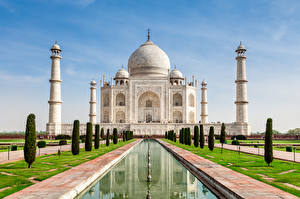

In [11]:
img=Image.open('tajmahal.jpg').convert('RGB')
img

In [13]:
tr_model.model.load_weights('./weights/rrdn-C4-D3-G64-G064-T10-x2/2020-07-30_1229/rrdn-C4-D3-G64-G064-T10-x2_best-val_generator_PSNR_Y_epoch008.hdf5')

Load better (pre trained models)

In [14]:
from ISR.models import RDN, RRDN

model_nc=RDN(weights='noise-cancel')
model_esrgan=RRDN(weights='gans')

17465344/17462488 [==============================] - 1s 0us/step


View Super Resolution Example

In [15]:
base1=np.array(img.resize(size=(img.size[0]*4,img.size[1]*4),resample=Image.BILINEAR))
srnc_img=model_nc.predict(np.array(img))
esrgan_img=model_esrgan.predict(np.array(img))
train_img=tr_model.predict(np.array(img))

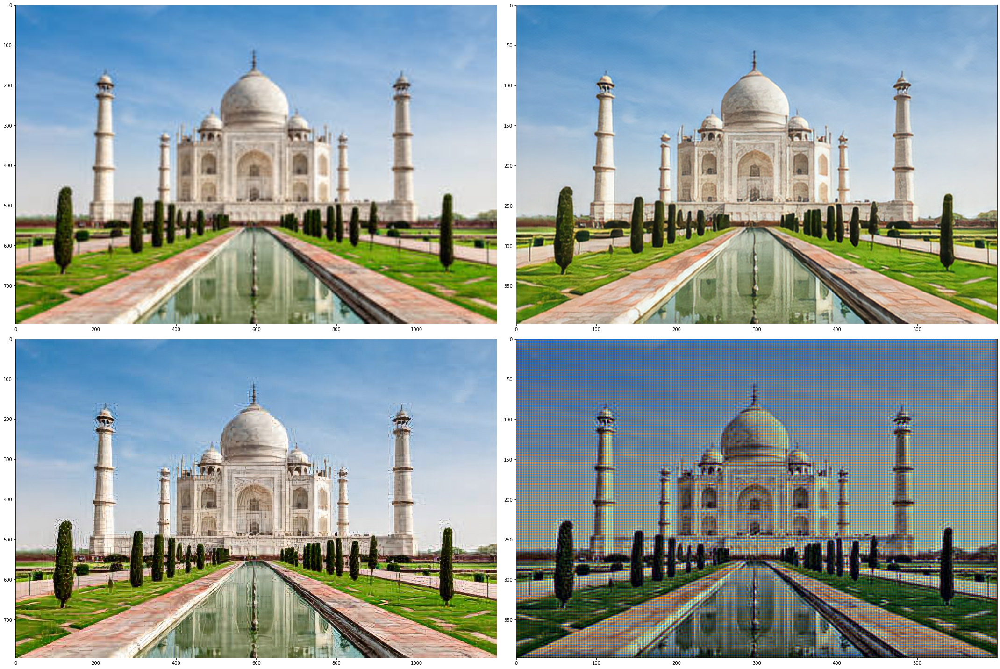

In [16]:
f, ax=plt.subplots(2,2, figsize=(30,20))
ax[0,0].imshow(base1)
ax[0,1].imshow(srnc_img)
ax[1,0].imshow(esrgan_img)
ax[1,1].imshow(train_img)
plt.tight_layout()

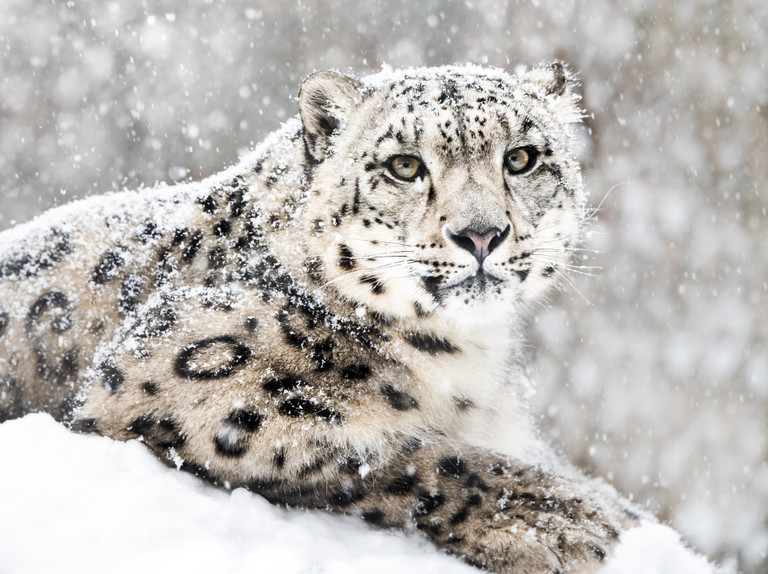

In [17]:
img=Image.open('snow_leo.jpg').convert('RGB')
img

In [19]:
base1=np.array(img.resize(size=(img.size[0]*4,img.size[1]*4),resample=Image.BILINEAR))
srnc_img=model_nc.predict(np.array(img))
esrgan_img=model_esrgan.predict(np.array(img))
train_img=tr_model.predict(np.array(img))

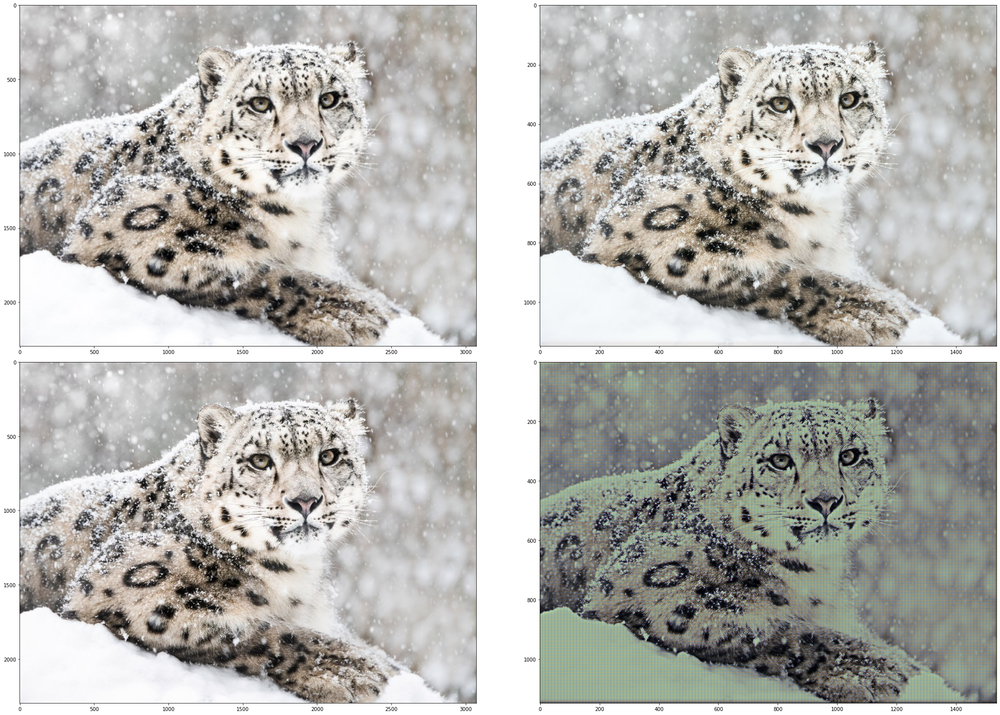

In [20]:
f, ax=plt.subplots(2,2, figsize=(30,20))
ax[0,0].imshow(base1)
ax[0,1].imshow(srnc_img)
ax[1,0].imshow(esrgan_img)
ax[1,1].imshow(train_img)
plt.tight_layout()